# Self-Driving Car Engineer Nanodegree 
## Project V : Vehicle Detection
[![Udacity - Self-Driving Car NanoDegree](https://s3.amazonaws.com/udacity-sdc/github/shield-carnd.svg)](http://www.udacity.com/drive)

---


#  Overview

In this project, your goal is to write a software pipeline to detect vehicles in a video (start with the test_video.mp4 and later implement on full project_video.mp4), but the main output or product we want you to create is a detailed writeup of the project.  Check out the [writeup template](https://github.com/udacity/CarND-Vehicle-Detection/blob/master/writeup_template.md) for this project and use it as a starting point for creating your own writeup.  

# Introduction
___
The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.


Here are links to the labeled data for [vehicle](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/vehicles.zip) and [non-vehicle](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/non-vehicles.zip) examples to train your classifier.  These example images come from a combination of the [GTI vehicle image database](http://www.gti.ssr.upm.es/data/Vehicle_database.html), the [KITTI vision benchmark suite](http://www.cvlibs.net/datasets/kitti/), and examples extracted from the project video itself.   You are welcome and encouraged to take advantage of the recently released [Udacity labeled dataset](https://github.com/udacity/self-driving-car/tree/master/annotations) to augment your training data.  

Some example images for testing your pipeline on single frames are located in the `test_images` folder.  To help the reviewer examine your work, please save examples of the output from each stage of your pipeline in the folder called `ouput_images`, and include them in your writeup for the project by describing what each image shows.    The video called `project_video.mp4` is the video your pipeline should work well on.  

**As an optional challenge** Once you have a working pipeline for vehicle detection, add in your lane-finding algorithm from the last project to do simultaneous lane-finding and vehicle detection!

**If you're feeling ambitious** (also totally optional though), don't stop there!  We encourage you to go out and take video of your own, and show us how you would implement this project on a new video!





# Getting Started
---

* Download images of the [vehicle](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/vehicles.zip) and [non-vehicle](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/non-vehicles.zip), a combination of the [GTI vehicle image database](http://www.gti.ssr.upm.es/data/Vehicle_database.html), the [KITTI vision benchmark suite](http://www.cvlibs.net/datasets/kitti/), and put them into folder `input_images`

    - `input_images`
       - `vehicles`    
       - `non-vehicles`
       
* Explore dataset, split images into training, validation, testing set and store into a pickle data.
* Extract HOG Features from dataset and feed them into Support Vector Machine (SVM) classifier to detect cars and non-cars, then save classfier data into a pickle data. 
* Implement a sliding-window technique and use the trained classifier to search for vehicles in images. 
* Run pipeline on a video stream 



In [114]:
%matplotlib inline 
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
import pickle
import random

from sklearn.utils import shuffle
#from sklearn.model_selection import train_test_split
from sklearn.cross_validation import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
from sklearn.externals import joblib
from lesson_functions import *

import imageio
imageio.plugins.ffmpeg.download()
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML, YouTubeVideo
from collections import deque
from scipy.ndimage.measurements import label

#random.seed(9001)


[//]: # (Image References)
[image1]: ./examples/car_not_car.png
[image2]: ./examples/HOG_example.jpg
[image3]: ./examples/sliding_windows.jpg
[image4]: ./examples/sliding_window.jpg
[image5]: ./examples/bboxes_and_heat.png
[image6]: ./examples/labels_map.png
[image7]: ./examples/output_bboxes.png
[video1]: ./project_video.mp4

## [Rubric](https://review.udacity.com/#!/rubrics/513/view) Points
###Here I will consider the rubric points individually and describe how I addressed each point in my implementation.  

---
### Writeup / README

#### Provide a Writeup / README that includes all the rubric points and how you addressed each one.  You can submit your writeup as markdown or pdf.  [Here](https://github.com/udacity/CarND-Vehicle-Detection/blob/master/writeup_template.md) is a template writeup for this project you can use as a guide and a starting point.  

You're reading it!

# 1. Data Exploration

In [115]:
cars = glob.glob('./input_images/vehicles/*/*.png')
noncars = glob.glob('./input_images/non-vehicles/*/*.png')
example_car = plt.imread(cars[0])

print('There are',  len(cars), 'images of cars')
print('There are',  len(noncars), 'images of non-cars')
print('Size of image is ', example_car.shape[0],  'x',example_car.shape[0] , 'pixels')

There are 8792 images of cars
There are 8968 images of non-cars
Size of image is  64 x 64 pixels


### * Split dataset into 70% training, 20% validation and 10% testing set*

In [116]:
#cars = shuffle(cars, random_state=0)
rand_state = np.random.randint(0, 100)

train_valid_cars, test_cars = train_test_split(cars, test_size=0.1, random_state=rand_state) 
train_cars, valid_cars = train_test_split(train_valid_cars, test_size=0.2, random_state=rand_state) 

noncars = shuffle(noncars, random_state=0)
train_valid_noncars, test_noncars = train_test_split(noncars, test_size=0.1) 
train_noncars, valid_noncars = train_test_split(train_valid_noncars, test_size=0.2) 

print('Number of samples in cars training set: ', len(train_cars))
print('Number of samples in notcars training set: ', len(train_noncars))

print('Number of samples in cars validation set: ', len(valid_cars))
print('Number of samples in notcars validation set: ', len(valid_noncars))

print('Number of samples in cars test set: ',len(test_cars))
print('Number of samples in notcars test set: ',len(test_noncars))

Number of samples in cars training set:  6329
Number of samples in notcars training set:  6456
Number of samples in cars validation set:  1583
Number of samples in notcars validation set:  1615
Number of samples in cars test set:  880
Number of samples in notcars test set:  897


### * Save training, validation and testing set into a pickle data.p*

In [117]:
# Save the data for easy access
pickle_file = 'data.p'
print('Saving data to pickle file...')
try:
    with open(pickle_file, 'wb') as pfile:
        pickle.dump(
            {
                'train_cars': train_cars,
                'train_noncars': train_noncars,
                'valid_cars': valid_cars,
                'valid_noncars': valid_noncars,
                'test_cars': test_cars,
                'test_noncars': test_noncars
            },
            pfile, pickle.HIGHEST_PROTOCOL)
except Exception as e:
    print('Unable to save data to', pickle_file, ':', e)
    raise

print('Data cached in pickle file.')

Saving data to pickle file...
Data cached in pickle file.


### * Here is an example of one of  the `vehicle` and `non-vehicle` classes*

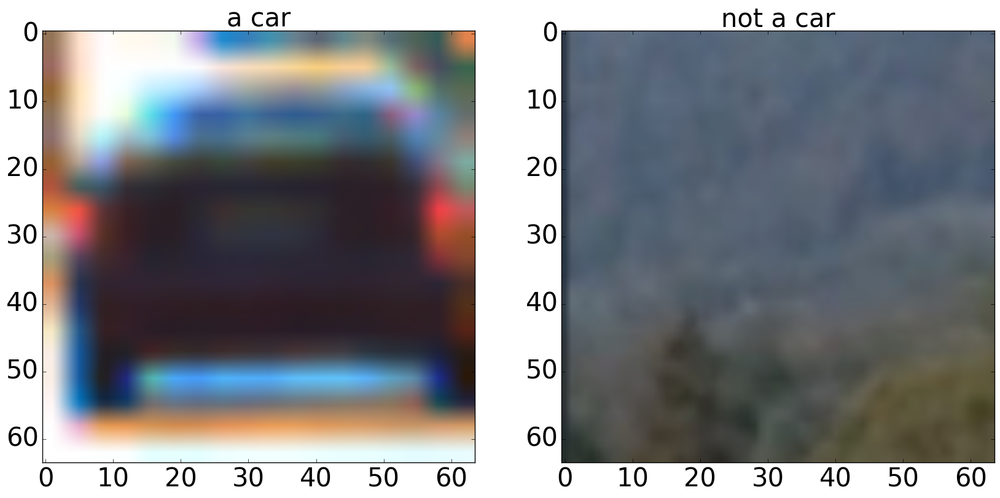

In [118]:
i = np.random.randint(0, 100)

a_car = plt.imread(train_cars[i])
not_a_car = plt.imread(train_noncars[i])

font_size=30
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(a_car)
ax1.set_title('a car', fontsize=font_size)
ax2.imshow(not_a_car)
ax2.set_title('not a car', fontsize=font_size)
plt.rc('xtick', labelsize=font_size) 
plt.rc('ytick', labelsize=font_size) 
plt.show()
#plt.savefig('./output_images/car_notcar.png')


# 2. Histogram of Oriented Gradients (HOG) Classification

### Load train, validation and test dataset of cars and non-cars

In [119]:
data_file = 'data.p'
with open(data_file, mode='rb') as f:
    data = pickle.load(f)
train_cars = data['train_cars']
train_noncars = data['train_noncars']
valid_cars = data['valid_cars']
valid_noncars = data['valid_noncars']
test_cars = data['test_cars']
test_noncars = data['test_noncars']

---


#### 2.1 Explain how (and identify where in your code) you extracted HOG features from the training images.

* I am using skimage.feature.hog to extract hog features from the vehicle/non-vehicle images.
  I tried different color spaces (HLS, HSV, YCrCb) and `skimage.hog()` parameters (`orientations`, `pixels_per_cell`, and `cells_per_block`) to extract significant features for the classification step.


* The following code will show the features of 2 vehicle and non-vehicle images using the HLS color space and HOG parameters of `orient=9`, `pixels_per_cell=(8, 8)` and `cells_per_block=(2, 2)`  



#### 2.2 Explain how you settled on your final choice of HOG parameters.

I tried various combinations of parameters and combination of HOG features and color spaces to train SVM classifier. I found that HLS color space provided a stable and good result comparing to other colors such as HSV, YCrCb or RGB.

                'orient': 9,
                'pix_per_cell': (8, 8),
                'cell_per_block': (2, 2)

                

#### 3.2 Describe how (and identify where in your code) you trained a classifier using your selected HOG features (and color features if you used them).

I trained a linear SVM using all YCrCb channels as well as spatial features color features. For color binning patches of spatial_size=(16,16) were generated and color histograms were implemented using hist_bins=32. The size of feature vector is 1836. The final accuracy of trained model SVM on validation and test data are over 99%

                'color_space': YCrCb,
                'spatial_size': (16,16),
                'hist_bins': 32,
                'orient': 9,
                'pix_per_cell': (8, 8),
                'cell_per_block': (2, 2),
                'hog_channel':'ALL',
                'spatial_feat': True ,
                'hist_feat': False ,
                'hog_feat':True 

### Here is an example using the `YCrCb` color space and HOG parameters of `orientations=9`, `pixels_per_cell=(8, 8)` and `cells_per_block=(2, 2)`:

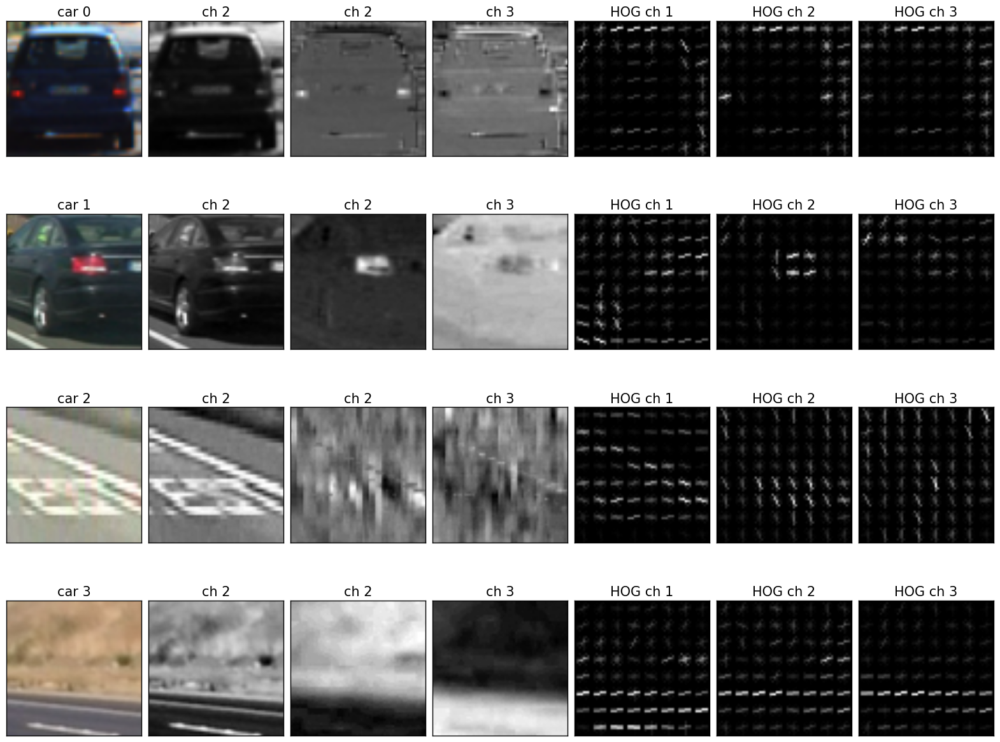

In [120]:
font_size=15

orient = 9              # HOG orientations
pix_per_cell = 8       # HOG pixels per cell
cell_per_block = 2      # HOG cells per block
#colorspace=cv2.COLOR_RGB2HSV
colorspace=cv2.COLOR_RGB2YCrCb
#colorspace = cv2.COLOR_RGB2HLS
#colorspace=cv2.COLOR_RGB2YUV

[k, l] = random.sample(range(0, 4000), 2)
sample_images =  [mpimg.imread(f) for f in [train_cars[k], train_cars[l], train_noncars[k] , train_noncars[l]]]

fig, axes = plt.subplots(4, 7, figsize=(20, 15))
fig.subplots_adjust(hspace=0.2, wspace=0.05)

for i , (image, ax) in enumerate(zip(sample_images, axes)):
    feature_image = cv2.cvtColor(image, colorspace)
    _,hog_image_1 = get_hog_features(feature_image[:,:,0], orient, pix_per_cell, 
                                          cell_per_block, vis=True, feature_vec=True)
    _,hog_image_2 = get_hog_features(feature_image[:,:,1], orient, pix_per_cell, 
                                          cell_per_block, vis=True, feature_vec=True)
    _,hog_image_3 = get_hog_features(feature_image[:,:,2], orient, pix_per_cell, 
                                          cell_per_block, vis=True, feature_vec=True)
                                          
    ax[0].imshow(image)
    ax[0].set_xticks([])
    ax[0].set_yticks([])

    title = "car {0}".format(i)
    ax[0].set_title(title, fontsize=font_size)
    
    ax[1].imshow(feature_image[:,:,0],cmap='gray')
    ax[1].set_title("ch 2", fontsize=font_size)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    
    ax[2].imshow(feature_image[:,:,1],cmap='gray')
    ax[2].set_title("ch 2", fontsize=font_size)
    ax[2].set_xticks([])
    ax[2].set_yticks([])
    
    ax[3].imshow(feature_image[:,:,2],cmap='gray')
    ax[3].set_title("ch 3", fontsize=font_size)
    ax[3].set_xticks([])
    ax[3].set_yticks([])
    
    ax[4].imshow(hog_image_1,cmap='gray')
    ax[4].set_title("HOG ch 1", fontsize=font_size)
    ax[4].set_xticks([])
    ax[4].set_yticks([])
    
    ax[5].imshow(hog_image_2,cmap='gray')
    ax[5].set_title("HOG ch 2", fontsize=font_size)
    ax[5].set_xticks([])
    ax[5].set_yticks([])
    
    ax[6].imshow(hog_image_3,cmap='gray')
    ax[6].set_title("HOG ch 3", fontsize=font_size)
    ax[6].set_xticks([])
    ax[6].set_yticks([])
              
plt.show()
#plt.savefig('./output_images/HOG_features_HLS.png')
#plt.savefig('./output_images/HOG_features_YCrCb.png')

### Extract features

In [121]:
# Define a function to extract features from a list of images
def extract_image_features(imgage_files , color_space='RGB', spatial_size=(32, 32), 
                           hist_bins=32, orient=9, 
                           pix_per_cell=8, cell_per_block=2, 
                           hog_channel=0,spatial_feat=True, 
                           hist_feat=True, hog_feat=True):

    features = []
    # Iterate through the list of images
    for file in imgage_files:        
        image = mpimg.imread(file)
        image_features = single_img_features(image , color_space = color_space, spatial_size = spatial_size, 
                                             hist_bins = hist_bins, orient=orient, 
                                             pix_per_cell = pix_per_cell, cell_per_block = cell_per_block, 
                                             hog_channel = hog_channel, spatial_feat = spatial_feat, 
                                             hist_feat = hist_feat, hog_feat = hog_feat)
        
        features.append(image_features)
        
    return features

In [122]:
### Tweak these parameters and see how the results change.
color_space = 'YCrCb'     # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 32          # Number of histogram bins
orient = 9              # HOG orientations
pix_per_cell = 8       # HOG pixels per cell
cell_per_block = 2      # HOG cells per block
hog_channel = 'ALL'     # Can be 0, 1, 2, or "ALL"
spatial_feat = True     # Spatial features on or off
hist_feat = False        # Histogram features on or off
hog_feat = True         # HOG features on or off

t=time.time()
train_car_features = extract_image_features(train_cars, color_space = color_space, spatial_size = spatial_size, 
                                             hist_bins = hist_bins, orient=orient, 
                                             pix_per_cell = pix_per_cell, cell_per_block = cell_per_block, 
                                             hog_channel = hog_channel, spatial_feat = spatial_feat, 
                                             hist_feat = hist_feat, hog_feat = hog_feat)
train_noncar_features = extract_image_features(train_noncars, color_space = color_space, spatial_size = spatial_size, 
                                             hist_bins = hist_bins, orient=orient, 
                                             pix_per_cell = pix_per_cell, cell_per_block = cell_per_block, 
                                             hog_channel = hog_channel, spatial_feat = spatial_feat, 
                                             hist_feat = hist_feat, hog_feat = hog_feat)

valid_car_features = extract_image_features(valid_cars, color_space = color_space, spatial_size = spatial_size, 
                                             hist_bins = hist_bins, orient=orient, 
                                             pix_per_cell = pix_per_cell, cell_per_block = cell_per_block, 
                                             hog_channel = hog_channel, spatial_feat = spatial_feat, 
                                             hist_feat = hist_feat, hog_feat = hog_feat)
valid_noncar_features = extract_image_features(valid_noncars, color_space = color_space, spatial_size = spatial_size, 
                                             hist_bins = hist_bins, orient=orient, 
                                             pix_per_cell = pix_per_cell, cell_per_block = cell_per_block, 
                                             hog_channel = hog_channel, spatial_feat = spatial_feat, 
                                             hist_feat = hist_feat, hog_feat = hog_feat)

test_car_features = extract_image_features(test_cars, color_space = color_space, spatial_size = spatial_size, 
                                             hist_bins = hist_bins, orient=orient, 
                                             pix_per_cell = pix_per_cell, cell_per_block = cell_per_block, 
                                             hog_channel = hog_channel, spatial_feat = spatial_feat, 
                                             hist_feat = hist_feat, hog_feat = hog_feat)
test_noncar_features = extract_image_features(test_noncars, color_space = color_space, spatial_size = spatial_size, 
                                             hist_bins = hist_bins, orient=orient, 
                                             pix_per_cell = pix_per_cell, cell_per_block = cell_per_block, 
                                             hog_channel = hog_channel, spatial_feat = spatial_feat, 
                                             hist_feat = hist_feat, hog_feat = hog_feat)


t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract HOG features...')

95.64 Seconds to extract HOG features...


In [123]:
# Create an array stack of feature vectors
X = np.vstack(( train_car_features, valid_car_features, test_car_features, 
               train_noncar_features, valid_noncar_features, test_noncar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)
len(scaled_X)

17760

### Generate train, validation and test feature vectors

In [124]:
ntrain_cars = len(train_cars) 
nvalid_cars = len(valid_cars)
ntest_cars = len(test_cars)
ntrain_noncars = len(train_noncars)
nvalid_noncars = len(valid_noncars)
ntest_noncars = len(test_noncars)

idx1 = ntrain_cars
idx2 = idx1 + nvalid_cars
idx3 = idx2 + ntest_cars
idx4 = idx3 + ntrain_noncars
idx5 = idx4 + nvalid_noncars
idx6 = idx5 + ntest_noncars



train_car_features = scaled_X[:idx1]
valid_car_features = scaled_X[idx1:idx2]
test_car_features = scaled_X[idx2:idx3]

train_noncar_features = scaled_X[idx3:idx4]
valid_noncar_features = scaled_X[idx4:idx5]
test_noncar_features = scaled_X[idx5:idx6]


X_train = np.vstack(( train_car_features, train_noncar_features))
X_valid = np.vstack(( valid_car_features, valid_noncar_features))
X_test = np.vstack(( test_car_features, test_noncar_features))

# Define the labels vector
y_train = np.hstack((np.ones(ntrain_cars), np.zeros(ntrain_noncars)))
y_valid = np.hstack((np.ones(nvalid_cars), np.zeros(nvalid_noncars)))
y_test = np.hstack((np.ones(ntest_cars), np.zeros(ntest_noncars)))

rand_state = np.random.randint(0, 100)
X_train, y_train = shuffle(X_train, y_train, random_state=rand_state)
X_valid, y_valid = shuffle(X_valid, y_valid, random_state=rand_state)
X_test, y_test = shuffle(X_test, y_test, random_state=rand_state)


'''
print(idx1,idx2- idx1,idx3- idx2,idx4-idx3,idx5-idx4, idx6-idx5)

print(ntrain_cars,nvalid_cars,ntest_cars)
print(len(train_car_features),len(valid_car_features),len(test_car_features))
print(ntrain_noncars,nvalid_noncars,ntest_noncars)
print(len(train_noncar_features),len(valid_noncar_features),len(test_noncar_features))

assert ntrain_cars == len(train_car_features), 'number of train data is correct'
assert nvalid_cars == len(valid_car_features), 'number of valid data is correct'
assert ntest_cars == len(test_car_features), 'number of test data is correct'
'''

"\nprint(idx1,idx2- idx1,idx3- idx2,idx4-idx3,idx5-idx4, idx6-idx5)\n\nprint(ntrain_cars,nvalid_cars,ntest_cars)\nprint(len(train_car_features),len(valid_car_features),len(test_car_features))\nprint(ntrain_noncars,nvalid_noncars,ntest_noncars)\nprint(len(train_noncar_features),len(valid_noncar_features),len(test_noncar_features))\n\nassert ntrain_cars == len(train_car_features), 'number of train data is correct'\nassert nvalid_cars == len(valid_car_features), 'number of valid data is correct'\nassert ntest_cars == len(test_car_features), 'number of test data is correct'\n"

In [125]:
print('Size of feature vector :', len(X_train[0]))
X_train.shape

Size of feature vector : 6060


(12785, 6060)

### Train SVM classifiers 

In [126]:
print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Size of feature vector :', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC(C=0.0001)
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
#print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

print('The final accuracy of trained model SVC on train_data is:', round(svc.score(X_train, y_train), 5))
print('The final accuracy of trained model SVC on valid_data is:', round(svc.score(X_valid, y_valid), 5))
print('The final accuracy of trained model SVC on test_data is:', round(svc.score(X_test, y_test), 5))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

Using: 9 orientations 8 pixels per cell and 2 cells per block
Size of feature vector : 6060
2.85 Seconds to train SVC...
The final accuracy of trained model SVC on train_data is: 0.99836
The final accuracy of trained model SVC on valid_data is: 0.9878
The final accuracy of trained model SVC on test_data is: 0.98875
My SVC predicts:  [ 1.  1.  0.  0.  0.  0.  0.  1.  0.  0.]
For these 10 labels:  [ 1.  1.  0.  0.  0.  0.  0.  1.  0.  0.]
0.0027 Seconds to predict 10 labels with SVC


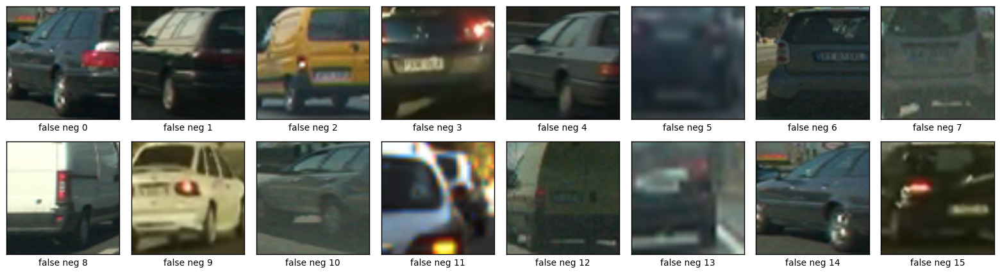

Number of misclassified car images: 28
Number of predicted car images: 1583


In [129]:
font_size=15
car_prediction = svc.predict(valid_car_features)
indx = np.where(car_prediction != np.ones(len(valid_car_features)))
indx = np.ravel(indx)

misclassifications = [valid_cars[i] for i in indx]

fig, axes = plt.subplots(2,8,figsize=(20,5))
fig.subplots_adjust(hspace=0.2, wspace=0.05)
    
for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(misclassifications[i]))
    xlabel = "false neg {0}".format(i)
    ax.set_xlabel(xlabel)
    ax.set_xticks([])
    ax.set_yticks([])     
    

plt.show()
print('Number of misclassified car images:',len(misclassifications))
print('Number of predicted car images:',len(car_prediction))
#plt.savefig('./output_images/false_negatives.png')

In [130]:
print(indx)
for i in indx:
    print('decision_function is:', svc.decision_function(X_valid[i]))

[  75  105  271  279  304  327  506  526  589  615  627  648  656  800  856
  979 1011 1039 1047 1062 1071 1138 1194 1232 1253 1284 1433 1493]
decision_function is: [-1.40860693]
decision_function is: [-1.69774116]
decision_function is: [-1.97590792]
decision_function is: [-1.56175635]
decision_function is: [ 0.87148379]
decision_function is: [-2.29751305]
decision_function is: [-1.31394755]
decision_function is: [-1.28485582]
decision_function is: [-1.32963155]
decision_function is: [ 1.75206606]
decision_function is: [-1.21439143]
decision_function is: [-1.57369353]
decision_function is: [-2.82161844]
decision_function is: [ 2.39511703]
decision_function is: [ 0.55863738]
decision_function is: [-1.59126791]
decision_function is: [ 1.83360817]
decision_function is: [ 1.47159811]
decision_function is: [-1.5361204]
decision_function is: [-2.00006361]
decision_function is: [-1.5536871]
decision_function is: [-1.8557311]
decision_function is: [ 1.61936275]
decision_function is: [-2.548496

Number of misclassified test car images: 14


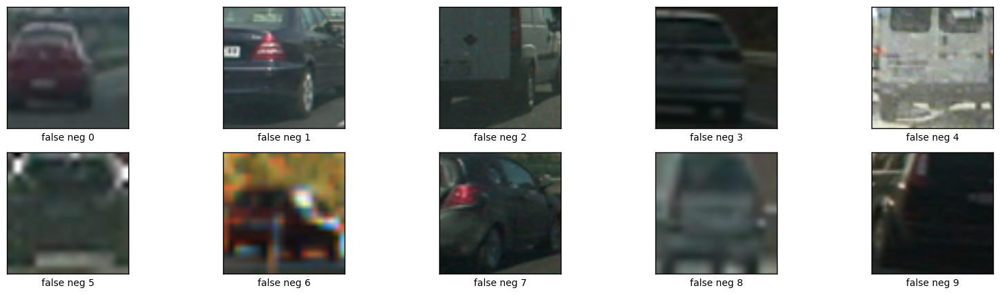

Number of misclassified test car images: 14
Number of predicted car images: 880


In [131]:
font_size=15
car_prediction = svc.predict(test_car_features)
indx = np.where(car_prediction != np.ones(len(test_car_features)))
indx = np.ravel(indx)

misclassifications = [test_cars[i] for i in indx]
print('Number of misclassified test car images:',len(misclassifications))
fig, axes = plt.subplots(2,5,figsize=(20,5))
fig.subplots_adjust(hspace=0.2, wspace=0.05)
    
for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(misclassifications[i]))
    xlabel = "false neg {0}".format(i)
    ax.set_xlabel(xlabel)
    ax.set_xticks([])
    ax.set_yticks([])     
    

plt.show()
print('Number of misclassified test car images:',len(misclassifications))
print('Number of predicted car images:',len(car_prediction))
#plt.savefig('./output_images/false_negatives.png')

Number of misclassified non-car images: 11


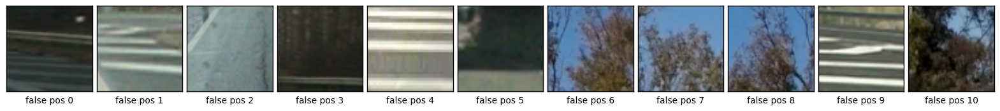

Number of misclassified noncar images (false positive): 11
Number of predicted noncar images: 1615


In [132]:
font_size=15
prediction = svc.predict(valid_noncar_features)
indx = np.where(prediction != np.zeros(len(valid_noncar_features)))
val_pos_indx = np.ravel(indx)

misclassifications = [valid_noncars[i] for i in val_pos_indx]
print('Number of misclassified non-car images:',len(misclassifications))

fig, axes = plt.subplots(1,len(misclassifications),figsize=(20,5))
fig.subplots_adjust(hspace=0.2, wspace=0.05)
    
for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(misclassifications[i]))
    xlabel = "false pos {0}".format(i)
    ax.set_xlabel(xlabel)
    ax.set_xticks([])
    ax.set_yticks([])     

plt.show()
print('Number of misclassified noncar images (false positive):',len(misclassifications))
print('Number of predicted noncar images:',len(prediction))
#plt.savefig('./output_images/false_positives.png')

Number of misclassified non-car images: 6


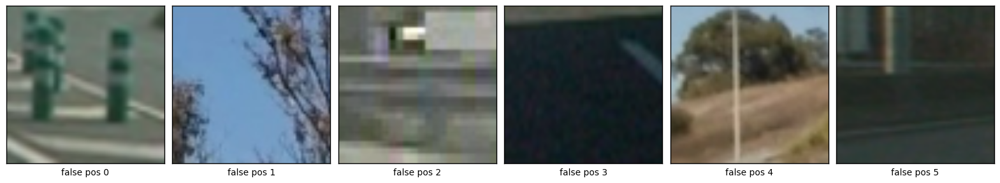

Number of misclassified test noncar images: 6
Number of predicted noncar images: 897


In [135]:
font_size=15
prediction = svc.predict(test_noncar_features)
indx = np.where(prediction != np.zeros(len(test_noncar_features)))
test_pos_indx = np.ravel(indx)

misclassifications = [test_noncars[i] for i in test_pos_indx]
print('Number of misclassified non-car images:',len(misclassifications))

fig, axes = plt.subplots(1,len(misclassifications),figsize=(20,5))
fig.subplots_adjust(hspace=0.2, wspace=0.05)
    
for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(misclassifications[i]))
    xlabel = "false pos {0}".format(i)
    ax.set_xlabel(xlabel)
    ax.set_xticks([])
    ax.set_yticks([])     

plt.show()
print('Number of misclassified test noncar images:',len(misclassifications))
print('Number of predicted noncar images:',len(prediction))
#plt.savefig('./output_images/false_positives.png')

Number of misclassified non-car images: 7


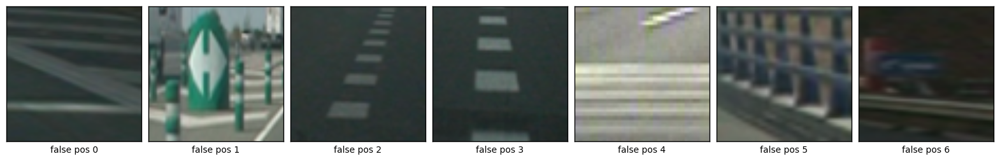

Number of misclassified test noncar images: 7
Number of predicted noncar images: 6456


In [137]:
prediction = svc.predict(train_noncar_features)
indx = np.where(prediction != np.zeros(len(train_noncar_features)))
train_pos_indx = np.ravel(indx)


misclassifications = [train_noncars[i] for i in train_pos_indx]
print('Number of misclassified non-car images:',len(misclassifications))

fig, axes = plt.subplots(1,len(misclassifications),figsize=(20,5))
fig.subplots_adjust(hspace=0.2, wspace=0.05)
    
for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(misclassifications[i]))
    xlabel = "false pos {0}".format(i)
    ax.set_xlabel(xlabel)
    ax.set_xticks([])
    ax.set_yticks([])     

plt.show()
print('Number of misclassified test noncar images:',len(misclassifications))
print('Number of predicted noncar images:',len(prediction))

In [127]:
'''
svr = LinearSVC()
param_grid = [ {'C': [0.0001, 0.001, 0.01]} ]

svc= GridSearchCV(svr, param_grid)


t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
print('The final accuracy of trained model SVC on valid_data is:', round(svc.score(X_valid, y_valid), 5))
print('The final accuracy of trained model SVC on test_data is:', round(svc.score(X_test, y_test), 5))

print('decision_function is:', svc.decision_function(X_train))
'''

"\nsvr = LinearSVC()\nparam_grid = [ {'C': [0.0001, 0.001, 0.01]} ]\n\nsvc= GridSearchCV(svr, param_grid)\n\n\nt=time.time()\nsvc.fit(X_train, y_train)\nt2 = time.time()\nprint(round(t2-t, 2), 'Seconds to train SVC...')\nprint('The final accuracy of trained model SVC on valid_data is:', round(svc.score(X_valid, y_valid), 5))\nprint('The final accuracy of trained model SVC on test_data is:', round(svc.score(X_test, y_test), 5))\n\nprint('decision_function is:', svc.decision_function(X_train))\n"

In [128]:
#sorted(svc.cv_results_.keys())

## Optimizing the classifier 

To reduce false positives and optimize the performance of the classifier with my chosen feature vector, I made some adjustments :

#### Exhaustive Grid Search
Run a grid search to optimize the SVC's C parameter (the best C = 0.0001)

         svr = LinearSVC()
         param_grid = [ {'C': [0.0001, 0.001, 0.01, 0.1, 1, 10]} ]
         svc= GridSearchCV(svr, param_grid)
         svc.fit(X_train, y_train)

#### Hard Negative Mining       
Augment the training with hard negative mining to decrease the false positive rate (i.e when I take that falsely detected cars, and explicitly create a negative example out of that false positive prediction, and add that negative to my training set. When I retrain SVM classifier, it performs better with this extra knowledge, and not make as many false positives.)


In [138]:
X_hard_negative_mining = np.vstack(( valid_noncar_features[val_pos_indx], test_noncar_features[test_pos_indx] ))
y_hard_negative_mining = np.hstack((np.zeros(len(val_pos_indx)), np.zeros(len(test_pos_indx))))

(17,)

In [160]:
print(X_hard_negative_mining.shape, y_hard_negative_mining.shape)

(17, 6060) (17,)


In [139]:
X_train = np.vstack(( X_train, X_hard_negative_mining ))
y_train = np.hstack(( y_train, y_hard_negative_mining ))
rand_state = np.random.randint(0, 100)
X_train, y_train = shuffle(X_train, y_train, random_state=rand_state)
y_train.shape

(12802,)

In [140]:
print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Size of feature vector :', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC(C=0.0001)
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
#print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

print('The final accuracy of trained model SVC on train_data is:', round(svc.score(X_train, y_train), 5))
print('The final accuracy of trained model SVC on valid_data is:', round(svc.score(X_valid, y_valid), 5))
print('The final accuracy of trained model SVC on test_data is:', round(svc.score(X_test, y_test), 5))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

Using: 9 orientations 8 pixels per cell and 2 cells per block
Size of feature vector : 6060
2.53 Seconds to train SVC...
The final accuracy of trained model SVC on train_data is: 0.99813
The final accuracy of trained model SVC on valid_data is: 0.98999
The final accuracy of trained model SVC on test_data is: 0.99212
My SVC predicts:  [ 1.  1.  0.  0.  0.  0.  0.  1.  0.  0.]
For these 10 labels:  [ 1.  1.  0.  0.  0.  0.  0.  1.  0.  0.]
0.00244 Seconds to predict 10 labels with SVC


### Save classifier parameters into a pickle

In [141]:
# Save the data for easy access
pickle_file = 'preprocessed-data.p'
print('Saving data to pickle file...')
try:
    with open(pickle_file, 'wb') as pfile:
        pickle.dump(
            {
                'X_train': X_train,
                'X_valid': X_valid,
                'X_test': X_test,
                'y_train': y_train,
                'y_valid': y_valid,
                'y_test': y_test
            },
            pfile, pickle.HIGHEST_PROTOCOL)
except Exception as e:
    print('Unable to save data to', pickle_file, ':', e)
    raise

print('Data cached in pickle file.')

Saving data to pickle file...
Data cached in pickle file.


In [142]:
# Save the data for easy access
pickle_file = 'classifier-data.p'
print('Saving data to pickle file...')
try:
    with open(pickle_file, 'wb') as pfile:
        pickle.dump(
            {
                'svc': svc,
                'X_scaler': X_scaler,
                'color_space': color_space,
                'spatial_size': spatial_size,
                'hist_bins': hist_bins,
                'orient': orient,
                'pix_per_cell': pix_per_cell,
                'cell_per_block': cell_per_block,
                'hog_channel': hog_channel,
                'spatial_feat': spatial_feat,
                'hist_feat': hist_feat,
                'hog_feat':hog_feat
            },
            pfile, pickle.HIGHEST_PROTOCOL)
except Exception as e:
    print('Unable to save data to', pickle_file, ':', e)
    raise

print('Data cached in pickle file.')

Saving data to pickle file...
Data cached in pickle file.


# 3. Search Classify

### Sliding Window Search

#### 3.1. Describe how (and identify where in your code) you implemented a sliding window search.  How did you decide what scales to search and how much to overlap windows?

I decided to segment the image into 4 partially overlapping zones with different sliding window sizes to account for different distances. The window sizes are 240,180,120 and 70 pixels for each zone. Within each zone adjacent windows have an ovelap of 75%, as illustrated below. The search over all zones is implemented in the search_all_scales(image) function. Using even slightly less than 75% overlap resulted in an unacceptably large number of false negatives.

#### 3.2. Show some examples of test images to demonstrate how your pipeline is working.  What did you do to optimize the performance of your classifier?

Ultimately the classifier uses HOG features from HLS channels plus spatially binned color and histograms of color in the feature vector, which provided a nice result. Some example images are shown below



### Video Implementation

#### 3.4. Provide a link to your final video output.  Your pipeline should perform reasonably well on the entire project video (somewhat wobbly or unstable bounding boxes are ok as long as you are identifying the vehicles most of the time with minimal false positives.)
Here are links to my video result

---



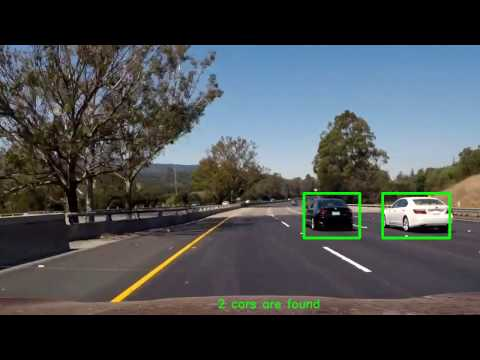

In [162]:
YouTubeVideo('5fd1NtHAEtM')

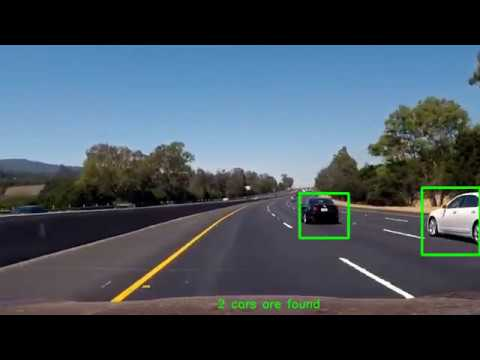

In [161]:
YouTubeVideo('YqY9A5q9TKQ')

#### 3.5. Describe how (and identify where in your code) you implemented some kind of filter for false positives and some method for combining overlapping bounding boxes.

I recorded the positions of positive detections in each frame of the video.  From the positive detections I created a heatmap and then thresholded that map to identify vehicle positions.  I then used `scipy.ndimage.measurements.label()` to identify individual blobs in the heatmap.  I then assumed each blob corresponded to a vehicle.  I constructed bounding boxes to cover the area of each blob detected.  


*  sample different patches from image by a sliding window on each image.
* predict vehicle/non-vehicle for each patch
* construct a heatmap (based on sum) of prediction probability based on predictions on each patch
* merge the patch to get bounding boxes from heatmap.

The class BoundingBoxes implements a FIFO queue that stores the bounding boxes of the last n frames. For every frame the (possibly empty) list of detected bounding boxes gets added to the beginning of the queue, while the oldest list of bounding boxes falls out. This queue is then used in the processing of the video and always contains the bounding boxes of the last n=20 frames. On these a threshold of 20 was applied, which also suppresses false positives from detected lane lines. Lane line positives together with false positives from rails on the side of the road proved very resistant to augmenting the training set unfortunately of positive detections in each frame of the video. From the positive detections I created a heatmap and then thresholded that map to identify vehicle positions.

More details are below.

### Here is the output of silding windows on each frame

In [145]:
# Load the training, validation and testing data
data_file = 'preprocessed-data.p'
with open(data_file, mode='rb') as f:
    data = pickle.load(f)
X_train = data['X_train']
X_val = data['X_valid']
X_test = data['X_test']
y_train = data['y_train']
y_val = data['y_valid']
y_test = data['y_test']

In [146]:
# Load the classifier and parameters
data_file = 'classifier-data.p'
with open(data_file, mode='rb') as f:
    data = pickle.load(f)
    
svc = data['svc'] 
X_scaler = data['X_scaler']
color_space = data['color_space']
spatial_size = data['spatial_size']
hist_bins = data['hist_bins']
orient = data['orient']
pix_per_cell = data['pix_per_cell']
cell_per_block = data ['cell_per_block']
hog_channel = data['hog_channel']
spatial_feat = data ['spatial_feat']
hist_feat = data['hist_feat']
hog_feat = data['hog_feat']

In [147]:
# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_all_windows(image):
    all_windows = []
    hot_windows = []
    #Y_start_stop =[[300,460]]
    #XY_window = [(150,150)]
    #X_start_stop =[[None,None]]    
    #X_start_stop =[[None,None],[None,None],[None,None]]    
    #Y_start_stop =[[390,440],[400,560],[400,560]]    
    #XY_window = [(80,80),(110,110),(130,130)]

    X_start_stop =[[None,None],[None,None]]    
    Y_start_stop =[[390,470],[390,500]]    
    XY_window = [(64,64),(110,110)]
    XY_overlap=[(0.75, 0.75),(0.75, 0.75)]

    X_start_stop =[[None,None],[None,None],[None,None],[None,None]]
    w0,w1,w2,w3 = 240,180,120,70
    o0,o1,o2,o3 = 0.75,0.75,0.75,0.75
    XY_window = [(w0,w0),(w1,w1),(w2,w2),(w3,w3)]
    XY_overlap = [(o0,o0),(o1,o1),(o2,o2),(o3,o3)]
    yi0,yi1,yi2,yi3 = 380,380,395,405                  
    Y_start_stop =[[yi0,yi0+w0/2],[yi1,yi1+w1/2],[yi2,yi2+w2/2],[yi3,yi3+w3/2]]    
    
    #y_start_stop = [None, None] # Min and max in y to search in slide_window()
    
    for i in range(len(Y_start_stop)):
        windows = slide_window(image, x_start_stop=X_start_stop[i], y_start_stop=Y_start_stop[i], 
                            xy_window=XY_window[i], xy_overlap=XY_overlap[i])
        
        all_windows += [windows]        
        
        hot_windows +=  search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)                       

    return all_windows, hot_windows

0.6 Seconds to search windows ...
0.61 Seconds to search windows ...
0.61 Seconds to search windows ...
0.63 Seconds to search windows ...
0.6 Seconds to search windows ...
0.61 Seconds to search windows ...


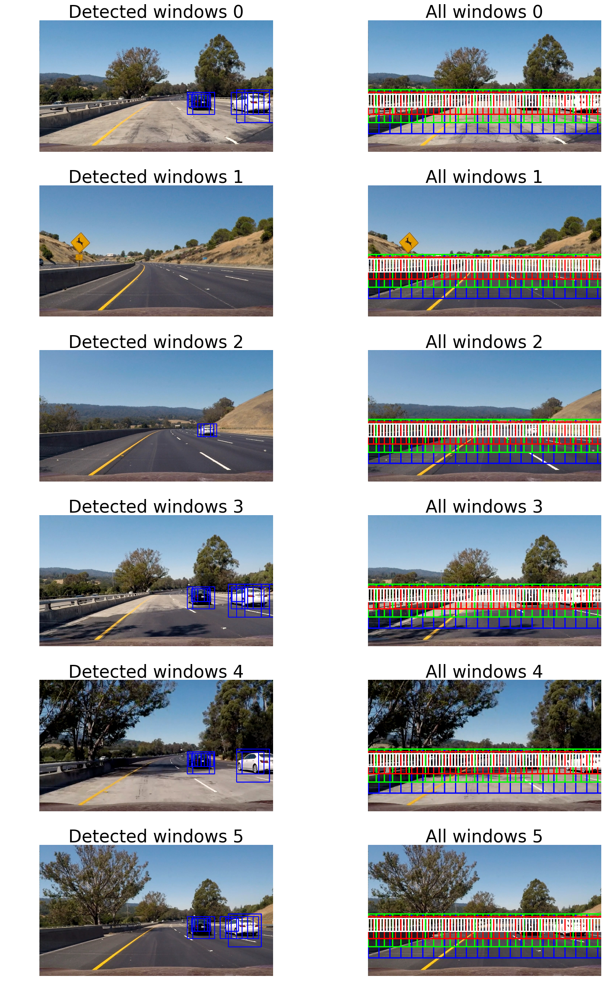

In [148]:
test_images = [mpimg.imread(f) for f in glob.glob('./test_images/*.jpg')]

fig, axes = plt.subplots(len(test_images), 2, figsize=(8*2, 4*len(test_images)))
fig.tight_layout()
for i , (image, ax) in enumerate(zip(test_images, axes)):

    image = image.astype(np.float32)/255
    draw_image = np.copy(image)
    
    t=time.time()
    all_windows, hot_windows = search_all_windows(image)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to search windows ...')



    window_image = draw_boxes(draw_image, hot_windows, color=(0, 0, 1), thick=4) 
    
    all_windows_image = draw_image
    for ind,win_list in enumerate(all_windows):
        if ind==0: color= (0,0,1)
        if ind==1: color= (0,1,0)
        if ind==2: color= (1,0,0)
        if ind==3: color= (1,1,1)
            
        all_windows_image = draw_boxes(all_windows_image, all_windows[ind], color=color, thick=6) 
        
    ax[0].imshow(window_image)
    ax[0].set_axis_off()
    xlabel0 = "Detected windows {0}".format(i)
    ax[0].set_title(xlabel0 , fontsize=30)
    ax[1].imshow(all_windows_image)
    ax[1].set_axis_off()
    xlabel1 = "All windows {0}".format(i)
    ax[1].set_title(xlabel1, fontsize=30)
    ax[1].set_xticks([])
    ax[1].set_yticks([]) 
    
plt.show()
#plt.savefig('./output_images/sliding_windows.png')

In [149]:
print('Size of all_windows :',len(all_windows))

Size of all_windows : 4


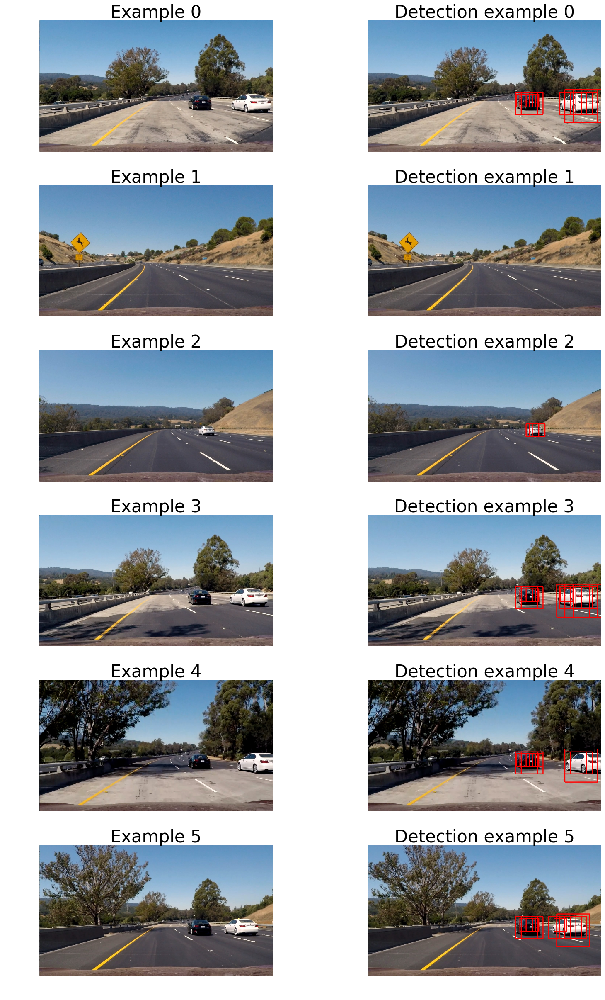

In [150]:
test_images = [mpimg.imread(f) for f in glob.glob("./test_images/*.jpg")]

fig, axes = plt.subplots(len(test_images), 2, figsize=(8*2, 4*len(test_images)))
fig.tight_layout()
for i , (image, ax) in enumerate(zip(test_images, axes)):

    image = image.astype(np.float32)/255
    draw_image = image.copy()
    #draw_image = np.copy(image)
    all_windows, hot_windows = search_all_windows(image)
    window_image = draw_boxes(draw_image, hot_windows, color=(1, 0, 0), thick=4) 
    ax[0].imshow(image)
    ax[0].set_axis_off()
    xlabel0 = "Example {0}".format(i)
    ax[0].set_title(xlabel0 , fontsize=30)
    ax[1].imshow(window_image)
    ax[1].set_axis_off()
    xlabel1 = "Detection example {0}".format(i)
    ax[1].set_title(xlabel1, fontsize=30)
    ax[1].set_xticks([])
    ax[1].set_yticks([])   
    
plt.show()
#plt.savefig('output_images/detection_example.png')

### BoundingBox class

In [151]:
# Define a class to receive the characteristics of bounding box detections
class BoundingBoxes:
    def __init__(self,n=10):
        # length of queue to store data
        self.n = n
        # hot windows of the last n images
        self.recent_boxes = deque([],maxlen=n)
        # current boxes
        self.current_boxes = None
        self.allboxes = []

    def add_boxes(self):
        self.recent_boxes.appendleft(self.current_boxes)
        
    def pop_data(self):        
        if self.n_buffered>0:
            self.recent_boxes.pop()            
    def set_current_boxes(self,boxes):
        self.current_boxes = boxes
        
    def get_all_boxes(self):        
        allboxes = []
        for boxes in self.recent_boxes:
            allboxes += boxes
        if len(allboxes)==0:
            self.allboxes = None
        else:
            self.allboxes = allboxes
            
    def update(self,boxes):
        self.set_current_boxes(boxes)
        self.add_boxes()
        self.get_all_boxes()

In [152]:
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,255,0), 6)
    # Return the image
    return img

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap


### Here are six frames, their heatmaps and resulting bounding boxes drawn onto their last frames

0.58 Seconds to search windows ...
0 cars are found
0.58 Seconds to search windows ...
0 cars are found
0.57 Seconds to search windows ...
1 cars are found
0.59 Seconds to search windows ...
2 cars are found
0.58 Seconds to search windows ...
2 cars are found
0.59 Seconds to search windows ...
2 cars are found


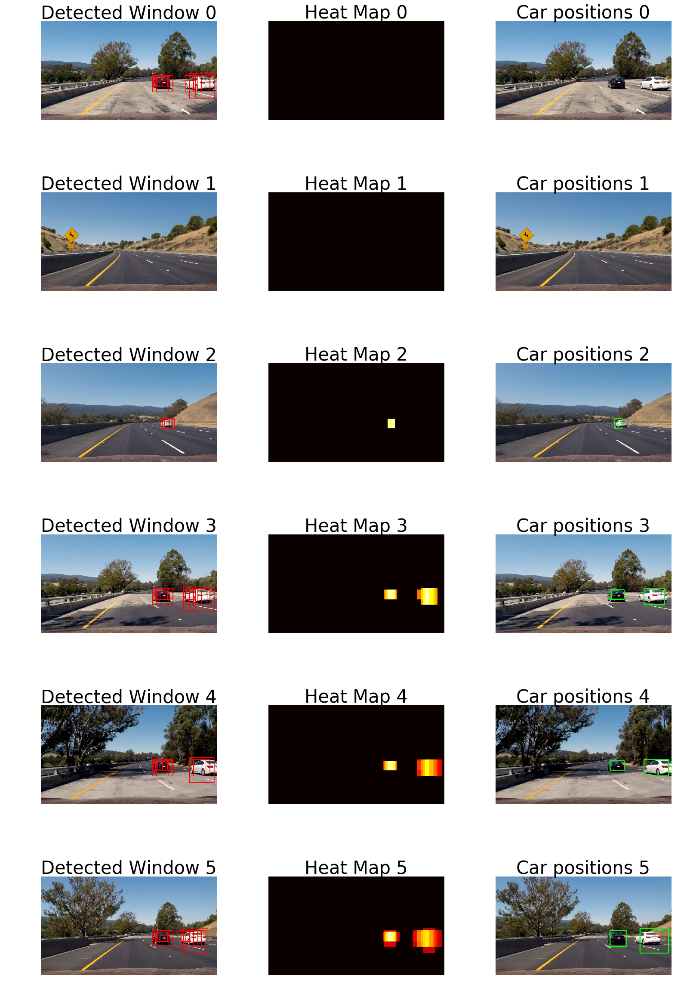

In [155]:
boxes = BoundingBoxes(n=6)
test_images = [mpimg.imread(f) for f in glob.glob('./test_images/*.jpg')]
fig, axes = plt.subplots(len(test_images), 3, figsize=(8*2, 4*len(test_images)))
fig.tight_layout()

for i , (image, ax) in enumerate(zip(test_images, axes)):
    
    #boxes = BoundingBoxes(n=10)
    draw_image = np.copy(image)
    image = image.astype(np.float32)/255
        
    t=time.time()
    all_windows, hot_windows = search_all_windows(image)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to search windows ...')

    boxes.update(hot_windows)

    window_image = draw_boxes(np.copy(image), hot_windows, color=(1, 0, 0), thick=4) 
    
    all_windows_image = draw_image
    for ind,win_list in enumerate(all_windows):
        if ind==0: color= (0,0,1)
        if ind==1: color= (0,1,0)
        if ind==2: color= (1,0,0)
        if ind==3: color= (1,1,1)
            
        all_windows_image = draw_boxes(all_windows_image, all_windows[ind], color=color, thick=6) 
        
    # Read in image similar to one shown above 
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat, boxes.allboxes)   
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,6)
        
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(draw_image, labels)
    print(labels[1], 'cars are found')
        
    ax[0].imshow(window_image)
    ax[0].set_axis_off()
    xlabel0 = "Detected Window {0}".format(i)
    ax[0].set_title(xlabel0 , fontsize=30)
    
    ax[1].imshow(heat, cmap='hot')
    ax[1].set_axis_off()
    xlabel1 = "Heat Map {0}".format(i)
    ax[1].set_title(xlabel1, fontsize=30)
    
    ax[2].imshow(draw_img)
    ax[2].set_axis_off()
    xlabel2 = "Car positions {0}".format(i)
    ax[2].set_title(xlabel2, fontsize=30)
        
plt.show()
#plt.savefig('./output_images/heatmap_detection.png')

In [156]:
labels

(array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ..., 
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int32), 2)

### Video pipeline

In [157]:
boxes = BoundingBoxes(n=40)

def process_image(image):
    #boxes = BoundingBoxes(n=40)
    draw_image = np.copy(image)
    image = image.astype(np.float32)/255
    #draw_image = np.copy(image)
    
    all_windows, hot_windows = search_all_windows(image)
    boxes.update(hot_windows) 
    
    # Read in image similar to one shown above 
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    
    # Add heat to each box in box list
    heat = add_heat(heat,boxes.allboxes)   
    
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,6)
    
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)
    
    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(draw_image, labels)
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    if labels[1] >= 2:
        str1 = str(str(labels[1]) + ' cars are found')
        
    elif  labels[1] >= 1:   
        str1 = str(str(labels[1]) + ' car is found')
    else:
        str1 = str( 'No car is found')
        
    cv2.putText(draw_img,str1,(580,700), font, 1,(0,255,0),2,cv2.LINE_AA)
    return draw_img

In [163]:
output_dir= './output_images/'
clip_input_file = 'test_video.mp4'
clip_output_file = output_dir +'processed_' + clip_input_file 
clip = VideoFileClip(clip_input_file)
clip_output = clip.fl_image(process_image)
%time clip_output.write_videofile(clip_output_file, audio=False)


[MoviePy] >>>> Building video ./output_images/processed_test_video.mp4
[MoviePy] Writing video ./output_images/processed_test_video.mp4


 97%|█████████▋| 38/39 [00:24<00:00,  1.57it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_images/processed_test_video.mp4 

CPU times: user 23.7 s, sys: 572 ms, total: 24.3 s
Wall time: 25.1 s


In [159]:
output_dir= './output_images/'
clip_input_file = 'project_video.mp4'
clip_output_file = output_dir +'processed_'  + clip_input_file
#clip = VideoFileClip(clip_input_file)
clip = VideoFileClip(clip_input_file).subclip(5, 50)
clip_output = clip.fl_image(process_image)
%time clip_output.write_videofile(clip_output_file, audio=False)

[MoviePy] >>>> Building video ./output_images/processed_project_video.mp4
[MoviePy] Writing video ./output_images/processed_project_video.mp4


100%|█████████▉| 1125/1126 [10:55<00:00,  1.85it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_images/processed_project_video.mp4 

CPU times: user 10min 40s, sys: 13 s, total: 10min 53s
Wall time: 10min 56s


# 4. Discussion

#### 4.1. Briefly discuss any problems / issues you faced in your implementation of this project.  Where will your pipeline likely fail?  What could you do to make it more robust?

Here I'll talk about the approach I took, what techniques I used, what worked and why, where the pipeline might fail and how I might improve it if I were going to pursue this project further.  

* There are still false positives still remain after heatmap filtering. This should be improvable by using more labeled data.

* Even though it is easy to train a SVM classifier with > 99% test accuracy on provided images and yet still generate some false positives.

* The evaluation of feature vectors can be optimized to  be parallelized

* The false positive predictions can be caused by the change of gradients which mean HOG features might contribute  the overfit in detecting a vehicle in each patch.

- http://www.robots.ox.ac.uk/~az/lectures/ml/lect2.pdf

- https://www.reddit.com/r/computervision/comments/2ggc5l/what_is_hard_negative_mining_and_how_is_it/

- http://cs.brown.edu/courses/cs143/2011/results/proj4/psastras/

- http://www.csc.kth.se/cvap/cvg/rg/materials/hossein_005_slides.pdf